توجه: فقط قسمت های خواسته شده را تکمیل کنید و همراه فایل خود مدل آموزش دیده را ارسال کنید.

هدف این تمرین :


1.   ساخت دیتاست مورد نیاز و نوشتن کلاس دیتاست
2.   Augmentation
3.   نوشتن مدل دسته بندی 3 کلاسه با استفاده از چند کلاس پایتون



# download data & import libraries

In [1]:
## download data
%%capture

!wget http://data.csail.mit.edu/places/ADEchallenge/release_test.zip
!wget http://data.csail.mit.edu/places/ADEchallenge/ADEChallengeData2016.zip
!unzip ADEChallengeData2016.zip
!unzip release_test.zip
!pip install mmengine

In [2]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch
import glob

from cv2 import imread as IM
from os import path

from torch.utils.data import Dataset
import torchvision.transforms as transforms
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import random
from torch.utils.data import random_split

from random import randint
import matplotlib.pyplot as plt

from google.colab.patches import cv2_imshow

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Data Generation

<div dir=rtl>

در این قسمت برای ساخت دیتاست مورد نیاز باید از هر تصویر دانلود شده ،2 تصویر یکی بدون تغییر و دیگری تغییر یافته به سایز 224 در 224 تولید کنید .به این منظور ابتداتابع های 1تا 6 را کامل کرده و سپس از تابع های 1تا3 برای ساخت تصویر تغییر یافته استفاده کنید.توجه داشته باشید که در تصاویر تولیدی تعدادی فقط یک تغییر و تعدادی دو و سه تغییر را باید داشته باشند،همچنین در تصاویر تولید شده نباید قسمت مشکی ناشی از چرخش وجود داشته باشد

توضیح برای نحوه عملکرد توابع ساخته شده:

*وقتی تصویر را 45 درجه میچرخانیم و میخواهیم به اندازه 224در224 برش دهیم ناحیه سایه ایجاد میشود .پس تصاویر کوچکتر از 224تقسیم بر رادیکال 2 که تقریبا معادل تصاویر 320در 320 است  را از دیتا ست ابتدا حذف میکنیم.*

*تصاویر اصلی 224x224 پیکسل مرکزی هر تصویر در نظر گرفته شد*.

الف)جابجایی : یک محدوده 300x300 در مرکز تصویر در نظر میگیریم و به طور  تصادفی یک قطعه 224x224 از این بین انتخاب میکنیم.

ب ) چرخش : ابتدا تصویر را با یک زاویه تصادفی میچرخانیم و سپس به اندازه 224x224 پیکسل از وسط آن برش میزنیم.

پ )اسکیل :از مرکز تصویر 2u*2u برش میزنیم که u یک عدد تصادفی بین 50 و 200 است.سپس آن را به 224x224 ریسایز میکنیم.به این نحو گویا  برخی zoom out  و  برخی تصاویر نیز zoom in شده اند.

ج )چرخش و جابجایی : مانند قبل ابتدا تصویر با زاویه تصادفی میچرخد و سپس در یک محدوده 300 در 300 به طور تصادفی 224در224 برش زده می شود تا عملا جابجایی را نیز انجام داده باشیم.

د )چرخش و اسکیل :چرخش با زاویه تصادفی و سپس انتخاب یک محدوده 2u*2u از مرکز تصویر که u یک عدد تصادفی بین 50 تا 150 است.

ه ) جابجایی و اسکیل : ابتدا یک 200در200 به طور تصادفی از بین 300در300 پیکسل وسط انتخاب میکنیم حالا یک 2u*2u از یان 400 پیکسل جدا میکنیمکه u یک عدد تصادفی بین 50 تا 150 است.


In [3]:
# function 1
def displacement(img):
  ## To Do
    h, w = img.shape[:2]
    crop_size = 224
    start_h = random.randint(h//2-150,h//2+150-crop_size)
    start_w = random.randint(w//2-150,w//2+150-crop_size)
    displaced_img = img[start_h:start_h+crop_size, start_w:start_w+crop_size]
    return displaced_img

# function 2
def rotation(img):
    angle = random.randint(0, 360)
    h, w = img.shape[:2]
    M = cv2.getRotationMatrix2D((w/2, h/2), angle, 1)
    rotated_img = cv2.warpAffine(img, M, (w, h))
    #Crop
    start_w = max(w // 2 - 112, 0)
    start_h = max(h // 2 - 112, 0)
    cropped_img = rotated_img[start_h:start_h+224, start_w:start_w+224]
    return cropped_img


# function 3
def scaling(img):
    u=random.randint(50,200)
    h, w = img.shape[:2]
    cropped_img = img[h//2-u:h//2+u, w//2-u :w//2+u]
    scaled_img = cv2.resize(cropped_img, (224, 224))
    return scaled_img

# function 4
def Brightness(img):  ## for augmentation
    if img is None:
        return img
    alpha = random.uniform(0.5, 1.5)
    adjusted = np.clip(img * alpha, 0, 255).astype(np.uint8)
    return adjusted

# function 5
def bluring(img):# for augmentation
    kernel_size = random.choice([3, 5, 7])
    blurred = cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)
    return blurred

# function 6
def gaussian_noise(img):#for augmentation
    mean = 0
    sigma = 10
    h, w, c = img.shape

    # Generating random Gaussian noise
    gaussian = np.random.normal(mean, sigma, (h, w, c))
    noisy_img = np.clip(img + gaussian, 0, 255).astype(np.uint8)

    return noisy_img


# function 7
def rot_disp(img) :
    angle = random.randint(0, 360)
    h, w = img.shape[:2]
    M = cv2.getRotationMatrix2D((w/2, h/2), angle, 1)
    rotated_img = cv2.warpAffine(img, M, (w, h))
    crop_size = 224
    start_h = random.randint(h//2-150,h//2+150-crop_size)
    start_w = random.randint(w//2-150,w//2+150-crop_size)
    rot_disp_img = rotated_img[start_h:start_h+crop_size, start_w:start_w+crop_size]
    return rot_disp_img

# function 8
def rot_scale(img) :
    angle = random.randint(0, 360)
    h, w = img.shape[:2]
    M = cv2.getRotationMatrix2D((w/2, h/2), angle, 1)
    rotated_img = cv2.warpAffine(img, M, (w, h))
    u=random.randint(50,150)
    cropped_img = rotated_img[h//2-u:h//2+u, w//2-u :w//2+u]
    rot_scaled_img = cv2.resize(cropped_img, (224, 224))
    return rot_scaled_img

# function 9
def disp_scale(img) :
    h, w = img.shape[:2]
    crop_size = 200
    start_h = random.randint(h//2-150,h//2+150-crop_size)
    start_w = random.randint(w//2-150,w//2+150-crop_size)
    displaced_img = img[start_h:start_h+crop_size, start_w:start_w+crop_size]
    u=random.randint(50,150)
    h, w = displaced_img.shape[:2]
    cropped_img = displaced_img[h//2-u:h//2+u, w//2-u :w//2+u]
    dis_scaled_img = cv2.resize(cropped_img, (224, 224))
    return dis_scaled_img

def original_img(img) :
    h, w = img.shape[:2]
    x_img=img[h//2-112:h//2+112,w//2-112:w//2+112]
    return x_img

<div dir=rtl>

توضیحات مربوط به کلاس تولید دیتاست :

ابتدا روی تصاویر یکی در میان آگمنتیشن انجام می دهیم(البته چیزی که معمول است در کمبود دیتا این عمل انجام می شود.ولی مطابق موارد خواسته شده در اینجا اعمال شد.)

حال تصاویر اورجینال را میسازیم.سپس به طور تصادفی یکی از 6 تابعی که نوشتیم را انتخاب میکنیم و روی تصاویر اصلی دیتاست اعمال میکنیم.لیبل متناظر با تصویر را نیز تولید میکنیم در انتها.

In [4]:
class CustomDataset(Dataset):

    def __init__(self,dataset):
        ## To Do
        self.data = dataset
        self.counter = 0

    def __len__(self):
      ## To Do
        return len(self.data)
    def __getitem__(self,idx):
      ## To Do

        img_path = self.data[idx]
        image=IM(img_path)

        if self.counter % 2 == 0:
            random_augmentation = random.choice([Brightness, bluring, gaussian_noise])
            image = random_augmentation(image)


        img1 = original_img(image)

        random_func = random.choice([displacement, rotation, scaling, rot_disp, rot_scale, disp_scale])
        img2 = random_func(image)

        if random_func in [displacement]:
            label = [1, 0, 0]
        elif random_func in [rotation]:
            label = [0, 1, 0]
        elif random_func in [scaling]:
            label = [0, 0, 1]
        elif random_func in [rot_disp]:
            label = [1, 1, 0]
        elif random_func in [rot_scale]:
            label = [0, 1, 1]
        elif random_func in [disp_scale]:
            label = [1, 0, 1]
        self.counter += 1

        return img1 , img2 , np.array(label)

In [5]:
directory = '/content/ADEChallengeData2016/images/validation'
for filename in os.listdir(directory):
    path = os.path.join(directory, filename)
    if os.path.isfile(path):
        img = cv2.imread(path)
        if img is not None:
            height, width, _ = img.shape
            if height < 320 or width < 320:
                os.remove(path)

directory = '/content/ADEChallengeData2016/images/training'
for filename in os.listdir(directory):
    path = os.path.join(directory, filename)
    if os.path.isfile(path):
        img = cv2.imread(path)
        if img is not None:
            height, width, _ = img.shape
            if height < 320 or width < 320:
                os.remove(path)


directory = '/content/release_test/testing'
for filename in os.listdir(directory):
    path = os.path.join(directory, filename)
    if os.path.isfile(path):
        img = cv2.imread(path)
        if img is not None:
            height, width, _ = img.shape
            if height < 320 or width < 320:
                os.remove(path)

In [6]:
trainingset = glob.glob(os.path.join('/content/ADEChallengeData2016/images/training', '*.jpg'))
validationset = glob.glob(os.path.join('/content/ADEChallengeData2016/images/validation', '*.jpg'))
testset = glob.glob(os.path.join('/content/release_test/testing', '*.jpg'))

trainingset=trainingset[:5000]
validationset=validationset[:1000]
testset=testset[:1000]

dataset_train = CustomDataset(trainingset)## To Do
dataset_test = CustomDataset(testset)## To Do
dataset_val = CustomDataset(validationset)## To Do

train_loader = DataLoader(dataset_train, batch_size=16, shuffle=True)## To Do
test_loader= DataLoader(dataset_test, batch_size=16, shuffle=False)## To Do
val_loader = DataLoader(dataset_val, batch_size=16, shuffle=False)## To Do



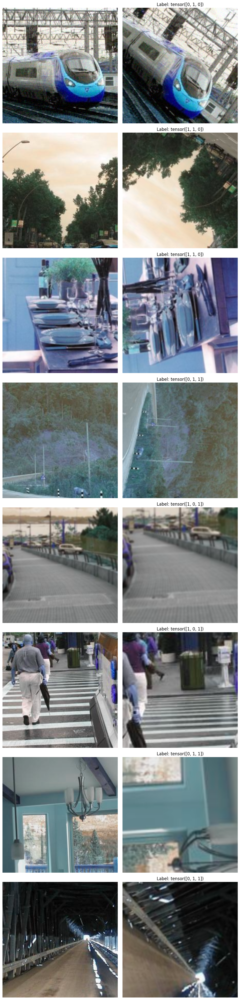

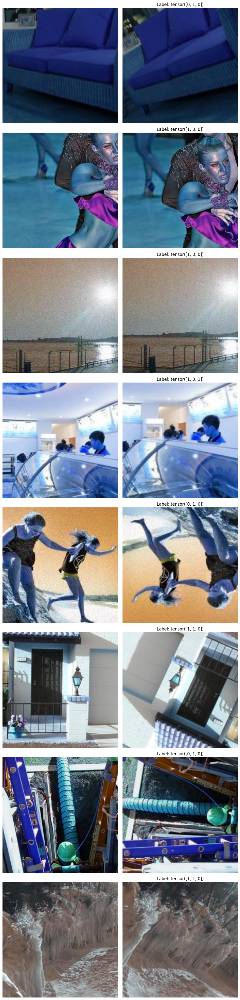

In [ ]:
## To Do  : show 8 images from train_loader & 8 images from test_loader
fig, axs = plt.subplots(8, 2, figsize=(10, 40))
img1, img2, label = next(iter(train_loader))
for i in range(8) :
    axs[i, 0].imshow(img1[i])
    axs[i, 0].axis('off')
    axs[i, 1].imshow(img2[i])
    axs[i, 1].axis('off')
    axs[i, 1].set_title(f"Label: {label[i]}")
plt.tight_layout()
plt.show()

fig, axs = plt.subplots(8, 2, figsize=(10, 40))
img1, img2, label = next(iter(test_loader))
for i in range(8) :
    axs[i, 0].imshow(img1[i])
    axs[i, 0].axis('off')
    axs[i, 1].imshow(img2[i])
    axs[i, 1].axis('off')
    axs[i, 1].set_title(f"Label: {label[i]}")
plt.tight_layout()
plt.show()

#Model

در این قسمت میخواهیم یک مدل 3 کلاسه  مطبق شکل زیرکه شامل قسمت های زیر میشود را آموزش دهیم.

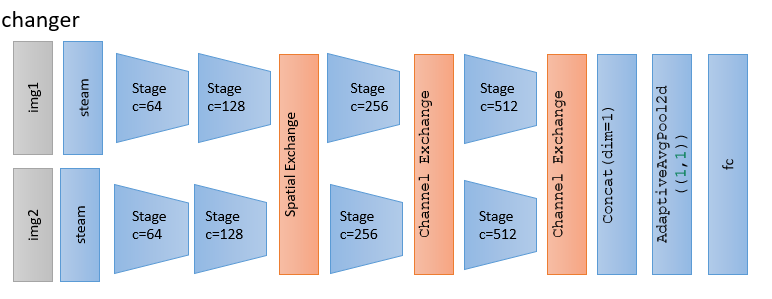

دو کلاس



1.   SpatialExchange
2.   ChannelExchange


 .مطابق شکل زیر ویژگی های دو تصویر را با هم عوض میکنند.


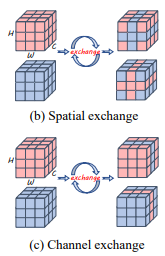

In [7]:
## dont change this block

from mmengine.model import BaseModule
class ChannelExchange(BaseModule):
    """
    channel exchange
    Args:
        p (float, optional): p of the features will be exchanged.
            Defaults to 1/2.
    """
    def __init__(self, p=1/2):
        super().__init__()
        assert p >= 0 and p <= 1
        self.p = int(1/p)

    def forward(self, x1, x2):
        N, c, h, w = x1.shape

        exchange_map = torch.arange(c) % self.p == 0
        exchange_mask = exchange_map.unsqueeze(0).expand((N, -1))

        out_x1, out_x2 = torch.zeros_like(x1), torch.zeros_like(x2)
        out_x1[~exchange_mask, ...] = x1[~exchange_mask, ...]
        out_x2[~exchange_mask, ...] = x2[~exchange_mask, ...]
        out_x1[exchange_mask, ...] = x2[exchange_mask, ...]
        out_x2[exchange_mask, ...] = x1[exchange_mask, ...]

        return out_x1, out_x2



class SpatialExchange(BaseModule):
    """
    spatial exchange
    Args:
        p (float, optional): p of the features will be exchanged.
            Defaults to 1/2.
    """
    def __init__(self, p=1/2):
        super().__init__()
        assert p >= 0 and p <= 1
        self.p = int(1/p)

    def forward(self, x1, x2):
        N, c, h, w = x1.shape
        exchange_mask = torch.arange(w) % self.p == 0

        out_x1, out_x2 = torch.zeros_like(x1), torch.zeros_like(x2)
        out_x1[..., ~exchange_mask] = x1[..., ~exchange_mask]
        out_x2[..., ~exchange_mask] = x2[..., ~exchange_mask]
        out_x1[..., exchange_mask] = x2[..., exchange_mask]
        out_x2[..., exchange_mask] = x1[..., exchange_mask]

        return out_x1, out_x2

شبکه ی زیر را پیاده کنید  

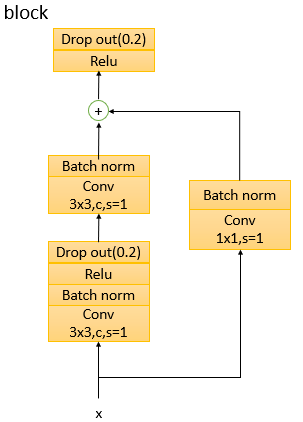

<div dir=rtl>

سوال تئوری1:

1.  مقادیر زیر را برای لایه های کانولوشن چه قدر در نظر گرفته اید؟

 channel out size (conv(1*1))

 این خروجی برابر یک است در حالت کلی ، ولی چون به تعداد channel_out در stage نیاز داریم آن را برابر channel_out در نظر گرفتیم.

 padding(conv)

چون چیزی ذکر نشده صفر در نظر گرفتیم.
2.  دلیل استفاده از کانولوشن 1در1 چیست؟

برای کاهش بعد ورودی است و همچنین جلوگیری از gradiant vanishing چون در بلوک Residual استفاده شده است.




In [8]:
##To Do
class block(nn.Module):
    def __init__(self, in_channels,out_channels):
        super(block, self).__init__()
        self.conv1 = nn.Conv2d(in_channels , out_channels , kernel_size=3, stride=1, padding=1)
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout2d(p=0.2)

        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1)
        self.bn2 = nn.BatchNorm2d(out_channels)

        self.conv_residual = nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=1)
        self.bn_residual = nn.BatchNorm2d(out_channels)

        self.dropout_residual = nn.Dropout2d(p=0.2)

    def forward(self, x):
        #first path
        out1 = self.conv1(x)
        out1 = self.bn1(out1)
        out1 = self.relu(out1)
        out1 = self.dropout(out1)
        out1 = self.conv2(out1)
        out1 = self.bn2(out1)

        # Second path (residual)
        out2 = self.conv_residual(x)
        out2 = self.bn_residual(out2)

        out = out1 + out2
        out = self.relu(out)
        out = self.dropout_residual(out)
        return out


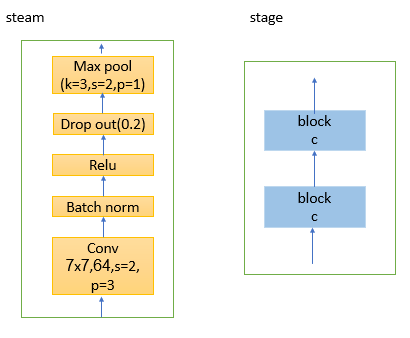

با استفاده از تصاویر مدل ،کلاس زیر را تکمیل کنید.

In [9]:
#To Do
class changer(nn.Module):
    def __init__(self, block, SpatialExchange, ChannelExchange):
        super(changer, self).__init__()

        self.steam = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=64, kernel_size=7, stride=2, padding=3),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Dropout2d(p=0.2),
            nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        )

        self.stage1 = self._make_stage(block, in_channels=64, out_channels=64)
        self.stage2 = self._make_stage(block, in_channels=64, out_channels=128)
        self.stage3 = self._make_stage(block, in_channels=128, out_channels=256)
        self.stage4 = self._make_stage(block, in_channels=256, out_channels=512)

        self.spatial_exchange = SpatialExchange()
        self.channel_exchange = ChannelExchange()

        self.concat = nn.Sequential(
            nn.Conv2d(in_channels=1024, out_channels=512, kernel_size=1),
            nn.BatchNorm2d(512),
            nn.ReLU()
        )

        self.adaptive_avg_pool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(512, 3)  # 3 classes

    def _make_stage(self , block , in_channels, out_channels):
        block1 = block(in_channels, out_channels)
        block2 = block(out_channels, out_channels)
        return nn.Sequential(block1, block2)

    def forward(self, x1, x2):
        out1 = self.steam(x1)
        out2 = self.steam(x2)

        out1 = self.stage1(out1)
        out2 = self.stage1(out2)

        out1 = self.stage2(out1)
        out2 = self.stage2(out2)

        out1,out2 = self.spatial_exchange(out1, out2)

        out1 = self.stage3(out1)
        out2 = self.stage3(out2)

        out1,out2 = self.channel_exchange(out1, out2)

        out1 = self.stage4(out1)
        out2 = self.stage4(out2)

        out1,out2 = self.channel_exchange(out1, out2)

        out = torch.cat((out1, out2), dim=1)
        out = self.concat(out)

        out = self.adaptive_avg_pool(out)
        out = out.view(out.size(0), -1)
        out = self.fc(out)

        return out

# Train & validation


In [ ]:
## To Do
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

model = changer(block, SpatialExchange, ChannelExchange)
model = model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0002)

epochs = 20
for epoch in range(epochs):
    running_loss = 0
    total = 0
    correct =0
    for i, (x1, x2 , labels) in enumerate(train_loader, 0):
        optimizer.zero_grad()

        x1 = x1.float().to(device)
        x2 = x2.float().to(device)
        x1 = x1.permute(0, 3, 1, 2)
        x2 = x2.permute(0, 3, 1, 2)

        # Forward Pass
        outputs = model(x1, x2)
        labels = labels.float().to(device)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        threshold = 0.05
        predicted = torch.round(outputs - threshold + 0.5)
        total += labels.size(0)
        u=(predicted == labels)
        correct += u.sum(dim=0)

        running_loss += loss.item()
    Loss_train=running_loss/total
    accuracy_train = 100 * correct / total
    with torch.no_grad():
        correct = 0
        total = 0
        loss_val = 0.0
        for x1_val, x2_val, labels_val in val_loader:
            x1_val = x1_val.float().to(device)
            x2_val = x2_val.float().to(device)
            x1_val = x1_val.permute(0, 3, 1, 2)
            x2_val = x2_val.permute(0, 3, 1, 2)
            labels_val = labels_val.float().to(device)

            outputs = model(x1_val, x2_val)
            threshold = 0.05
            predicted = torch.round(outputs - threshold + 0.5)
            total += labels_val.size(0)
            u=(predicted == labels_val)
            correct += u.sum(dim=0)
            loss_val += criterion(outputs, labels_val).item()

        accuracy_val = 100 * correct / total
        Loss_val=loss_val/total

        print(f'Epoch [{epoch + 1}/{epochs}],   Accuracy_training: displacement :{accuracy_train[0]:.4f}% , rotation :{accuracy_train[1]:.4f}% , scaling :{accuracy_train[2]:.4f}%')
        print(f'Epoch [{epoch + 1}/{epochs}], Accuracy_validation: displacement :{accuracy_val[0]:.4f}% , rotation :{accuracy_val[1]:.4f}% , scaling :{accuracy_val[2]:.4f}%')
        print(f'Epoch [{epoch + 1}/{epochs}], Loss_train: {Loss_train:.4f}, Loss_val: {Loss_val:.4f}')

    torch.save(model.state_dict(), f'model_epoch_{epoch + 1}.pt')

print('Finished Training')

cuda
Epoch [1/20],   Accuracy_training: displacement :50.1200% , rotation :50.5600% , scaling :51.3400%
Epoch [1/20], Accuracy_validation: displacement :49.4000% , rotation :50.1000% , scaling :50.1000%
Epoch [1/20], Loss_train: 0.1044, Loss_val: 0.1058
Epoch [2/20],   Accuracy_training: displacement :49.6200% , rotation :51.6200% , scaling :51.2200%
Epoch [2/20], Accuracy_validation: displacement :50.9000% , rotation :51.2000% , scaling :48.1000%
Epoch [2/20], Loss_train: 0.1032, Loss_val: 0.1041
Epoch [3/20],   Accuracy_training: displacement :50.2400% , rotation :53.6200% , scaling :51.0600%
Epoch [3/20], Accuracy_validation: displacement :49.9000% , rotation :55.9000% , scaling :52.5000%
Epoch [3/20], Loss_train: 0.1040, Loss_val: 0.1047
Epoch [4/20],   Accuracy_training: displacement :50.7000% , rotation :58.2600% , scaling :53.7400%
Epoch [4/20], Accuracy_validation: displacement :49.9000% , rotation :58.1000% , scaling :55.7000%
Epoch [4/20], Loss_train: 0.1018, Loss_val: 0.1025

<div dir=rtl>

همانطور که ملاحظه می شود در بین 20 ایپاک ، در ایپاک 17 تقریبا عملکرد بهتری روی داده های validation داشته ایم.البته اگر تعداد ایپاک ها بیشتر بود احتمالا به نتایج بهتری نیز میرسیدیم ولی فعلا به همین نتایج بسنده میکنیم.

#Test


In [21]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
criterion = nn.CrossEntropyLoss()
model = changer(block, SpatialExchange, ChannelExchange)

checkpoint = torch.load('/content/model_epoch_17.pt')
model.load_state_dict(checkpoint)

model.eval()
model = model.to(device)
## To Do test
with torch.no_grad():
        correct = 0
        total = 0
        loss_test = 0.0
        u=0
        for x1_test, x2_test, labels_test in test_loader:
            x1_test = x1_test.float().to(device)
            x2_test = x2_test.float().to(device)
            x1_test = x1_test.permute(0, 3, 1, 2)
            x2_test = x2_test.permute(0, 3, 1, 2)
            labels_test = labels_test.float().to(device)

            outputs = model(x1_test, x2_test)
            threshold = 0.05
            predicted = torch.round(outputs - threshold + 0.5)
            total += labels_test.size(0)
            u=(predicted == labels_test)
            correct += u.sum(dim=0)

            loss_test += criterion(outputs, labels_test).item()

        accuracy_test = 100 * correct / total
        print(f'Accuracy, testing set: displacement :{accuracy_test[0]:.3f}% , rotation :{accuracy_test[1]:.3f}% , scaling :{accuracy_test[2]:.3f}%')
        print(f' loss_test= {loss_test/total:.3f}, acc_test={accuracy_test.sum()/3}')

cuda
Accuracy, testing set: displacement :53.200% , rotation :65.800% , scaling :55.500%
 loss_test= 0.101, acc_test=58.16666793823242


سوال تئوری:
بررسی کنید عکس ها با یک ،2 یا 3 تغییر کدام بهتر تشخیص داده میشوند؟

In [22]:
with torch.no_grad():
    u=0
    for x1_test, x2_test, labels_test in test_loader:
          labels_test = labels_test.float()
          u += labels_test.sum()
    print(u)

tensor(1485.)


<div dir=rtl>

در نتیجه 485 تصویر داریم که شامل دو تغییر هستند و باقی تصاویر(از 1000 تصویر تست) شامل یک تغییر می باشند.

ما در دقت سنجی قبلی فقط تشخیص تغییر را ملاک دقت قرار داده بودیم.یعنی اگر یک تصویر دارای دو تغییر بود و ما توانسته بودیم یک تغییر آن را شناسایی کنیم در دقت عملمان تاثیرش میدادیم.

ولی اینجا ابتدا بررسی میکنیم کدام تغییرات درست تشخیص داده شده اند(همانند مرحله قبل)و سپس بررسی میکنیم آن ردیف در کل شامل چند تغییر است(sum(dim=1)) وسپس با لیبل های اصلی مقایسه میکنیم دوباره تا ببینیم تعداد تغییرات مشابه آن هست یا نه.

In [35]:
with torch.no_grad():
        num_both_twos = 0
        num_both_ones = 0
        total = 0
        for x1_test, x2_test, labels_test in test_loader:
            x1_test = x1_test.float().to(device)
            x2_test = x2_test.float().to(device)
            x1_test = x1_test.permute(0, 3, 1, 2)
            x2_test = x2_test.permute(0, 3, 1, 2)
            labels_test = labels_test.float().to(device)

            outputs = model(x1_test, x2_test)
            threshold = 0.05
            predicted = torch.round(outputs - threshold + 0.5)
            total += labels_test.size(0)
            u1=(predicted == labels_test).sum(dim=1)
            u2=labels_test.sum(dim=1)

            num_both_twos += torch.sum(torch.logical_and(torch.eq(u1, 2), torch.eq(u2, 2))).item()

            num_both_ones += torch.sum(torch.logical_and(torch.eq(u1, 1), torch.eq(u2, 1))).item()
t_change=num_both_twos/485 * 100
o_change=num_both_ones/515 * 100
print(f"acc of two changes: {t_change:.2f}%")
print(f"acc of one change: {o_change:.2f}%")

acc of two changes: 44.74%
acc of one change: 18.64%


<div dir=rtl>

همانطور که ملاحظه میشود در تصاویر دارای دو تغییر دقت بهتری داریم ، با کمال تعجب البته !